## BERT_Topic_Modeling

In [12]:
import numpy as np
import pandas as pd
import nltk
import bertopic
from bertopic import BERTopic


In [2]:
#!pip install setuptools wheel
#!pip install spacy

In [3]:
#! pip install bertopic

In [4]:
#! pip install spacy

In [5]:
# from sklearn.datasets import fetch_20newsgroups  
# docs = fetch_20newsgroups(subset='all', remove=('headers','footers', 'quotes'))['data'] 
# docs[:10]

In [100]:
tuckerdata=pd.read_csv('Tucker_transcripts_2.17.23.tsv',sep='\t').drop(columns = ['Unnamed: 0'])
tuckerdocs=tuckerdata.text.to_list()
timestamps = tuckerdata.timestamp.to_list()

In [98]:
tuckerdata

,url,timestamp,title,text
0,https://www.foxnews.com/opinion/tucker-carlson...,2018-11-27 08:39:00,Tucker Carlson: Socialism with open borders is...,Democrats want to eliminate restrictions on im...
1,https://www.foxnews.com/opinion/tucker-carlson...,2018-11-28 07:16:00,"Tucker Carlson: For the crime of forgetting, J...",Jerome Corsi addresses charges against him in ...
2,https://www.foxnews.com/opinion/tucker-carlson...,2018-11-29 11:12:00,Tucker Carlson: The word 'Russia' eliminates a...,"On Wednesday, Tucker Carlson exposes the flaws..."
3,https://www.foxnews.com/opinion/tucker-carlson...,2018-11-30 09:21:00,Tucker Carlson: The Mueller probe and what we ...,Michael Cohen pleads guilty to lying to Congre...
4,https://www.foxnews.com/opinion/tucker-carlson...,2018-12-04 08:08:00,Tucker Carlson: The Mueller probe continues to...,"On Monday, Tucker Carlson talks to Jerome Cors..."
...,...,...,...,...
808,https://www.foxnews.com/opinion/tucker-carlson...,2023-02-08 22:25:00,TUCKER CARLSON: The lies 'just kept coming' du...,Fox News host Tucker Carlson reacts to Presid...
809,https://www.foxnews.com/opinion/tucker-carlson...,2023-02-09 22:19:00,TUCKER CARLSON: Self-defense is becoming illeg...,WARNING: Graphic footage—Fox News host Tucker ...
810,https://www.foxnews.com/opinion/tucker-carlson...,2023-02-13 22:23:00,"TUCKER CARLSON: Food, water, energy and infras...",Fox News host Tucker Carlson reacts to leaders...
811,https://www.foxnews.com/opinion/tucker-carlson...,2023-02-14 22:51:00,TUCKER CARLSON: Mayor Pete is completely incom...,Fox News host Tucker Carlson calls out the Bid...


In [97]:
#print(tuckerdocs[100])

In [ ]:
#topic_model.get_topic_info()  

In [374]:
from nltk.corpus import stopwords
nltk.download('stopwords')
from nltk.tokenize import word_tokenize

nltk.download('wordnet')
nltk.download('stopwords')

stop_words = stopwords.words('english')
stop_words.extend(['from', 'tucker', 'carlson', 'fox', 'news', 'channel', 'host', 'evening', 'welcome', 'tonight','like','kind','people','know','knew','knowing','tonight',
                   'go','goes','going', 'went','tell','told','telling','say','said','saying','talk','talked','talking','year','think','thinking','thought','happen','happening',
                   'happened','thing','time','right', 'country', 'countries','america', 'american', 'want','state','work','worked','point','call','calling', 'called', 'actual',
                   'actually','year','live','living','theyre','shes','thats','one','dont','well','would','even','hes','youre','di','got','get','way','president','democrats',
                   'democratic','republican','republicans','party','states','new','us'])

# vectorizer_model = CountVectorizer(ngram_range=(1, 2), stop_words="english")

# tuckermodel2 = BERTopic(
#     vectorizer_model=vectorizer_model,
#     language='english', calculate_probabilities=True,
#     verbose=True
# )
# topics, probs = tuckermodel2.fit_transform(tuckerdocs)

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Owner\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\Owner\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Owner\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [375]:
from sklearn.feature_extraction.text import CountVectorizer
docs = tuckerdocs
vectorizer_model = CountVectorizer(stop_words= stop_words)
topic_model = BERTopic(vectorizer_model=vectorizer_model)
topics, probs = topic_model.fit_transform(docs)

In [376]:
topic_model.get_topic_info()  

,Topic,Count,Name
0,-1,224,-1_biden_joe_trump_really
1,0,117,0_vaccine_china_chinese_coronavirus
2,1,94,1_police_white_rittenhouse_city
3,2,52,2_biden_energy_gas_inflation
4,3,49,3_biden_joe_bidens_white
5,4,45,4_trump_mueller_russia_flynn
6,5,40,5_border_immigration_illegal_immigrants
7,6,33,6_warren_sanders_bernie_bloomberg
8,7,30,7_twitter_musk_elon_media
9,8,25,8_ukraine_war_russia_putin


In [377]:
topic_model.get_topic(3)

[('biden', 0.050841870979336956),
 ('joe', 0.03818405600836584),
 ('bidens', 0.016995173385785333),
 ('white', 0.012294719883772046),
 ('years', 0.010259993519127042),
 ('first', 0.010003406082929914),
 ('question', 0.009579961078040072),
 ('voters', 0.009025178724497767),
 ('every', 0.008983938768331335),
 ('cant', 0.008974091711965546)]

In [378]:
#topic_model.get_representative_docs(1)
topic_model.get_document_info(docs)

,Document,Topic,Name,Top_n_words,Probability,Representative_document
0,Democrats want to eliminate restrictions on im...,5,5_border_immigration_illegal_immigrants,border - immigration - illegal - immigrants - ...,0.782319,False
1,Jerome Corsi addresses charges against him in ...,4,4_trump_mueller_russia_flynn,trump - mueller - russia - flynn - schiff - fb...,0.972856,False
2,"On Wednesday, Tucker Carlson exposes the flaws...",4,4_trump_mueller_russia_flynn,trump - mueller - russia - flynn - schiff - fb...,0.450537,False
3,Michael Cohen pleads guilty to lying to Congre...,-1,-1_biden_joe_trump_really,biden - joe - trump - really - fact - course -...,0.000000,False
4,"On Monday, Tucker Carlson talks to Jerome Cors...",4,4_trump_mueller_russia_flynn,trump - mueller - russia - flynn - schiff - fb...,0.893043,False
...,...,...,...,...,...,...
808,Fox News host Tucker Carlson reacts to Presid...,11,11_joe_biden_fetterman_rogan,joe - biden - fetterman - rogan - twitter - ke...,1.000000,False
809,WARNING: Graphic footage—Fox News host Tucker ...,1,1_police_white_rittenhouse_city,police - white - rittenhouse - city - capitol ...,0.860176,False
810,Fox News host Tucker Carlson reacts to leaders...,-1,-1_biden_joe_trump_really,biden - joe - trump - really - fact - course -...,0.000000,False
811,Fox News host Tucker Carlson calls out the Bid...,-1,-1_biden_joe_trump_really,biden - joe - trump - really - fact - course -...,0.000000,False


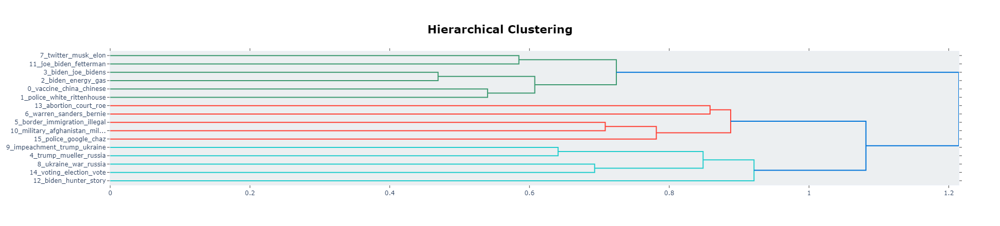

In [379]:
topic_model.visualize_hierarchy()

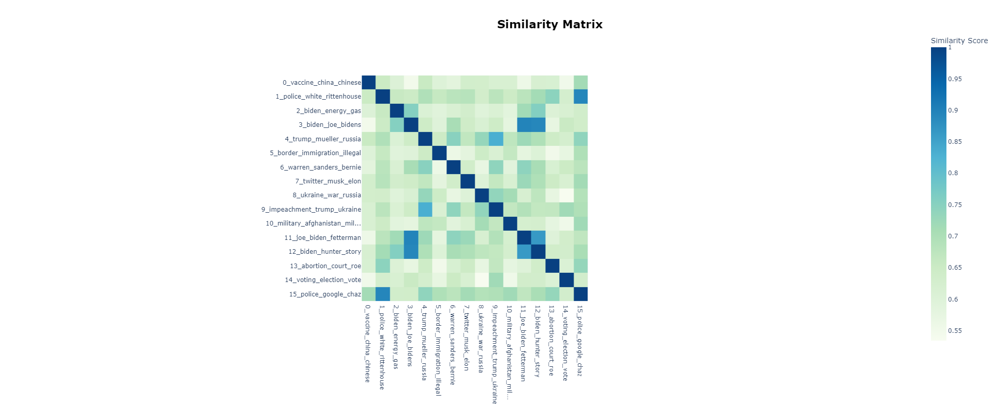

In [380]:
topic_model.visualize_heatmap()

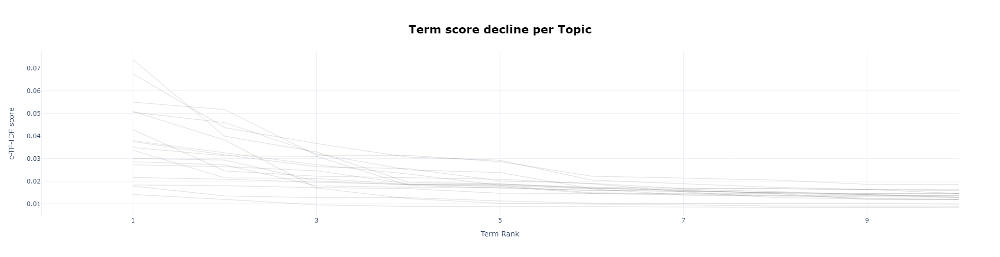

In [381]:
topic_model.visualize_term_rank()

In [382]:
topics_over_time = topic_model.topics_over_time(docs, timestamps, nr_bins=20)

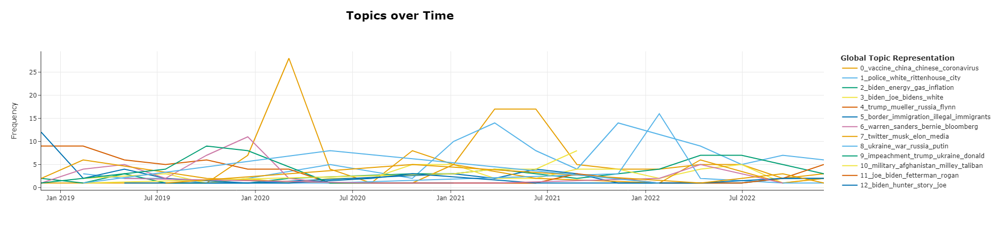

In [383]:
topic_model.visualize_topics_over_time(topics_over_time)

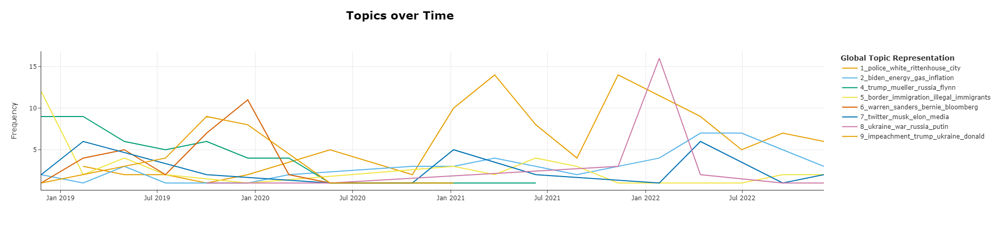

In [384]:
topic_model.visualize_topics_over_time(topics_over_time, topics=[1,2,4,5,6,7,8,9])

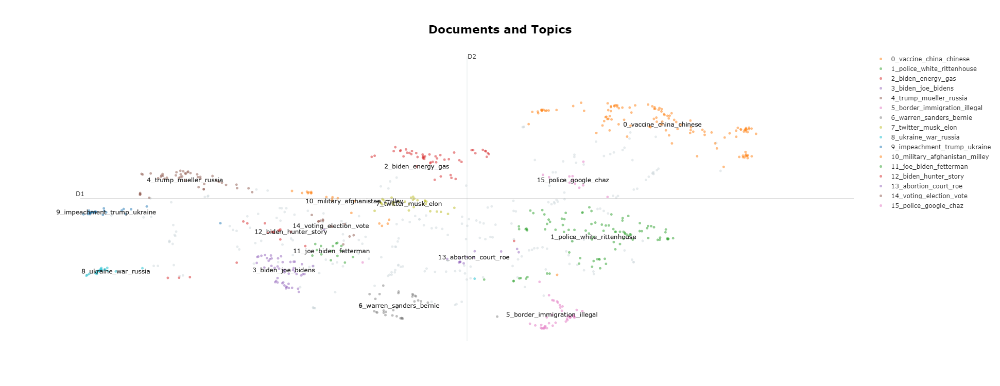

In [385]:
fig3 = topic_model.visualize_documents(docs)
fig3.show()

In [69]:

#topic_model.save("my_BERT_model1")

In [ ]:

# we add this to remove stopwords
#vectorizer_model = CountVectorizer(ngram_range=(1, 2), stop_words="english")

# maddowmodel = BERTopic(
#     vectorizer_model=vectorizer_model,
#     language='english', calculate_probabilities=True,
#     verbose=True
# )
# topics, probs = maddowmodel.fit_transform(maddowdocs)

In [ ]:
# maddowmodel.get_topic_info()  

In [ ]:
# maddowmodel.get_topic(0)

In [ ]:
# maddowmodel.visualize_topics()

In [ ]:

# model.save("my_model")

In [ ]:
# from bertopic import BERTopic 
# model = BERTopic.load("my_model")

# topics, probs = model.transform(docs)



In [ ]:
# model = BERTopic() 
# topics, probs = model.fit_transform(docs)  
# # Reduce topics 
# new_topics, new_probs = model.reduce_topics(docs, topics, nr_topics=10)


In [ ]:
# topics_to_merge = [1, 2] 
# model.merge_topics(docs, topics, topics_to_merge)

## Guided Topic Modelling with BerTopic

In [342]:
pew= pd.read_excel('issue dict 2.xlsx')
condensed= pd.read_excel('condense dict.xlsx')
condensedexp= pd.read_excel('condensed expanded.xlsx')

In [343]:
pew['expanded dict']=pew['primary dict']+','+pew['expanded dict']

In [344]:
condensed

,issue,condensed dict
0,Abortion,"wade,roe,abortion,dobbs"
1,Education,"education,school,teachers,parents"
2,Immigration,"immigration,immigrants,southern,border"
3,Violent crime,"crime,theft,violent,homeless"
4,Gun policy,"second,ammendment,mass,shootings"
5,Energy policy/climate change,"energy,climate,oil,solar,wind"
6,Economy,"economy,inflation,prices,market"
7,Issues around race and ethnicity,"floyd,rittenhouse,race,racism"
8,Voting policies/democracy/Jan 6,"january,election,capitol,democracy"
9,Foreign policy,"ukraine,russia,china,war"


In [345]:
for count, pewrow in enumerate(pew['primary dict']):
    pew['primary dict'][count] = pewrow.split(',')
    
for count, pewrow in enumerate(pew['expanded dict']):
    pew['expanded dict'][count] = pewrow.split(',')   
    
for count, pewrow in enumerate(condensed['condensed dict']):
    condensed['condensed dict'][count] = pewrow.split(',')    
    
for count, pewrow in enumerate(condensedexp['expanded dict']):
    condensedexp['expanded dict'][count] = pewrow.split(',')     
    
seed_topic_primary = pew['primary dict'].to_list()
seed_topic_expanded= pew['expanded dict'].to_list()
seed_topic_condensed = condensed['condensed dict'].to_list()
seed_topic_condensedexp = condensedexp['expanded dict'].to_list()


In [357]:
seed_topic_condensed

[['wade', 'roe', 'abortion', 'dobbs'],
 ['education', 'school', 'teachers', 'parents'],
 ['immigration', 'immigrants', 'southern', 'border'],
 ['crime', 'theft', 'violent', 'homeless'],
 ['second', 'ammendment', 'mass', 'shootings'],
 ['energy', 'climate', 'oil', 'solar', 'wind'],
 ['economy', 'inflation', 'prices', 'market'],
 ['floyd', 'rittenhouse', 'race', 'racism'],
 ['january', 'election', 'capitol', 'democracy'],
 ['ukraine', 'russia', 'china', 'war'],
 ['coronavirus', 'covid', 'pandemic', 'vaccine'],
 ['investigation', 'trump', 'mueller', 'classified'],
 ['investigation', 'biden', 'bidens', 'hunter']]

In [358]:

vectorizer_model = CountVectorizer(stop_words= stop_words)
topic_model = BERTopic(vectorizer_model=vectorizer_model, seed_topic_list=seed_topic_condensedexp)
topics, probs = topic_model.fit_transform(docs)

## No topic seeding

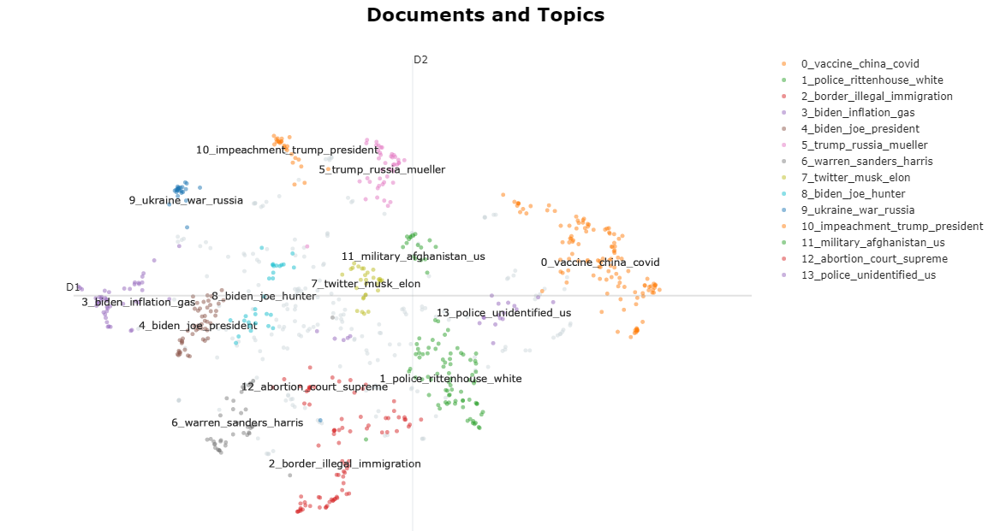

## Condensed Limited Dict

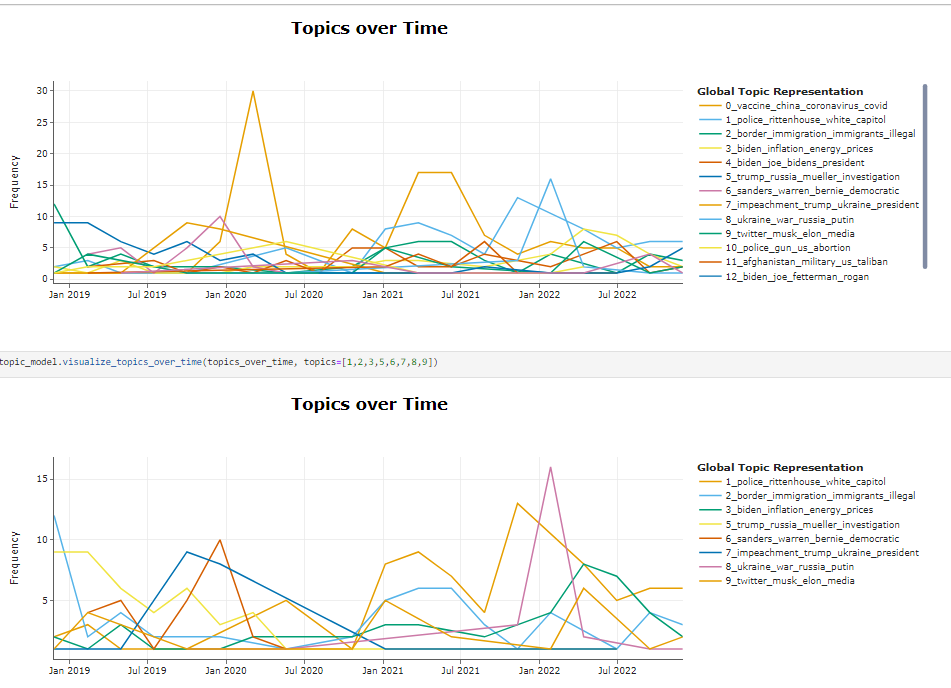

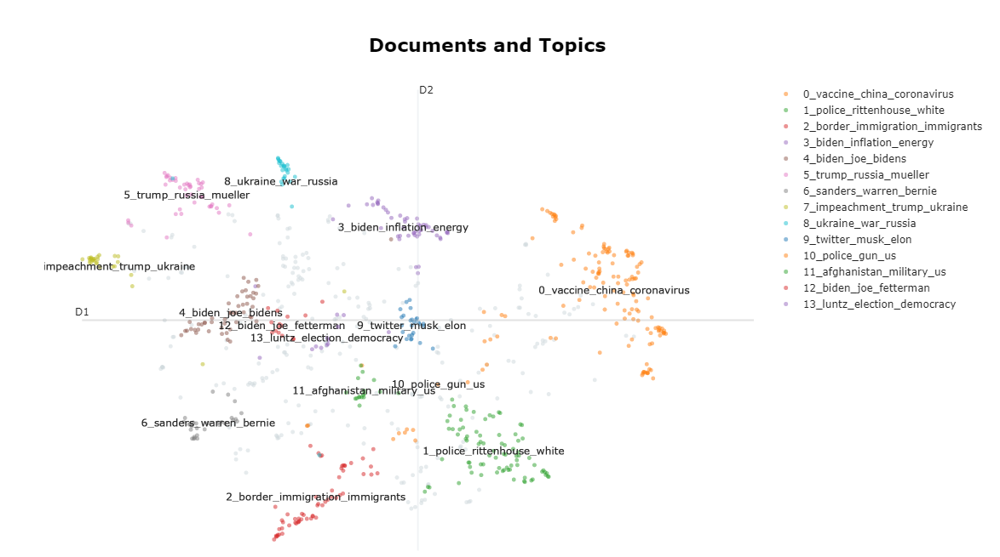

## Expanded dict

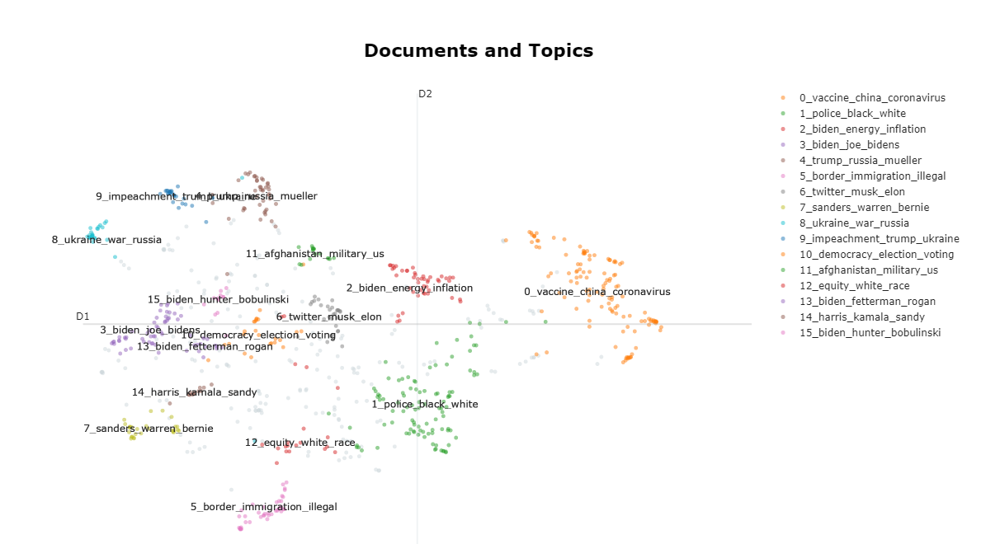

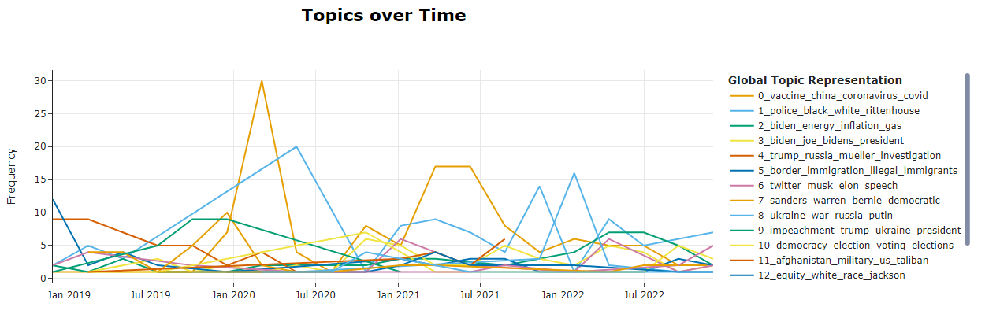

## Condensed Expanded Dict

# Rachel Maddow BerTopic